In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 14

In [3]:
data = np.loadtxt('traj_booz_convective_s02_eta0.txt')

In [4]:
print(data.shape)

(100001, 5)


In [5]:
data1 = data[:6500,:]
# data1 = data

In [6]:
t = data1[:, 0]
s = data1[:, 1]
eta = data1[:, 2]

x = s * np.cos(eta)
y = s * np.sin(eta)

n_total = len(t)
n_frames = 200
step = max(1, n_total // n_frames)

fig, (ax_rho, ax_xy) = plt.subplots(1, 2, figsize=(12, 5))

ax_rho.set_xlim(t[0], t[-1])
ax_rho.set_ylim(0, s.max() * 1.1)
ax_rho.set_xlabel('t')
ax_rho.set_ylabel(r'$s$')
line_rho, = ax_rho.plot([], [], lw=1.5)

xy_pad = 0.05
xy_max = max(np.abs(x).max(), np.abs(y).max()) * (1 + xy_pad)
ax_xy.set_xlim(-xy_max, xy_max)
ax_xy.set_ylim(-xy_max, xy_max)
ax_xy.set_xlabel(r'$s \cdot \cos(\chi)$')
ax_xy.set_ylabel(r'$s \cdot \sin(\chi)$')
ax_xy.set_aspect('equal')
line_xy, = ax_xy.plot([], [], lw=1.5)
fig.tight_layout()
plt.close(fig)

trail = 100

def update(frame):
    idx = min((frame + 1) * step, n_total)
    start = max(0, idx - trail)
    line_rho.set_data(t[:idx], s[:idx])
    line_xy.set_data(x[start:idx], y[start:idx])
    return line_rho, line_xy

anim = FuncAnimation(fig, update, frames=n_frames, interval=50, blit=True)
HTML(anim.to_jshtml())

In [23]:
anim.save('trajectory_convective.gif', writer='pillow', dpi=150)

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


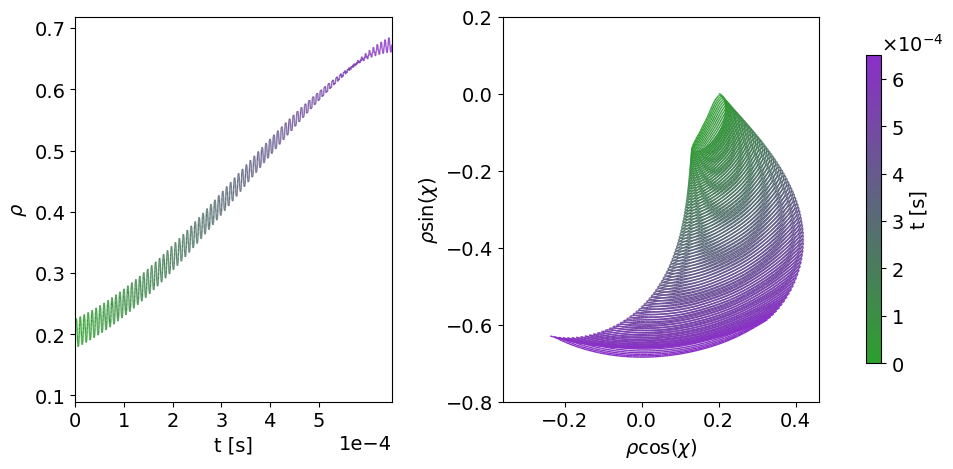

In [38]:
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list('green_purple', ['#2ca02c', '#8b2fc9'])
norm = plt.Normalize(t[0], t[-1])

fig, (ax_rho, ax_xy) = plt.subplots(1, 2, figsize=(12, 5))
fig.subplots_adjust(wspace=0.35)

# rho vs t
pts = np.column_stack([t, s]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_rho = LineCollection(segs, cmap=cmap, norm=norm, linewidths=1.0)
lc_rho.set_array(t[:-1])
ax_rho.add_collection(lc_rho)
ax_rho.set_xlim(t[0], t[-1])
ax_rho.set_ylim(s.min() * 0.5, s.max() * 1.05)
ax_rho.set_xlabel('t [s]')
ax_rho.set_ylabel(r'$\rho$')
ax_rho.set_xticks(10**(-4)*np.array([0, 1, 2, 3, 4, 5]))

# x-y plane
pts = np.column_stack([x, y]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_xy = LineCollection(segs, cmap=cmap, norm=norm, linewidths=1.0)
lc_xy.set_array(t[:-1])
ax_xy.add_collection(lc_xy)
xy_pad = 0.05
xy_max = max(np.abs(x).max(), np.abs(y).max()) * (1 + xy_pad)
ax_xy.set_xlim(-0.4, 0.5)
ax_xy.set_ylim(-0.8, 0.2)
ax_xy.set_xlabel(r'$\rho \cos(\chi)$')
ax_xy.set_ylabel(r'$\rho \sin(\chi)$')
ax_xy.set_aspect('equal', adjustable='datalim')
ax_rho.ticklabel_format(style='sci', axis='x', scilimits=(0,0))

from matplotlib.ticker import ScalarFormatter, MaxNLocator

cb = fig.colorbar(lc_rho, ax=[ax_rho, ax_xy], label='t [s]', shrink=0.8)
fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((0, 0))
cb.ax.yaxis.set_major_formatter(fmt)
cb.ax.yaxis.get_offset_text().set_position((1.0, 1.02))
cb.ax.yaxis.get_offset_text().set_ha('left')
cb.ax.yaxis.set_major_locator(MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))

fig.savefig('convection_plot.pdf', dpi=300)

plt.show()

3 panel plot for Labbate et al., 2026

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


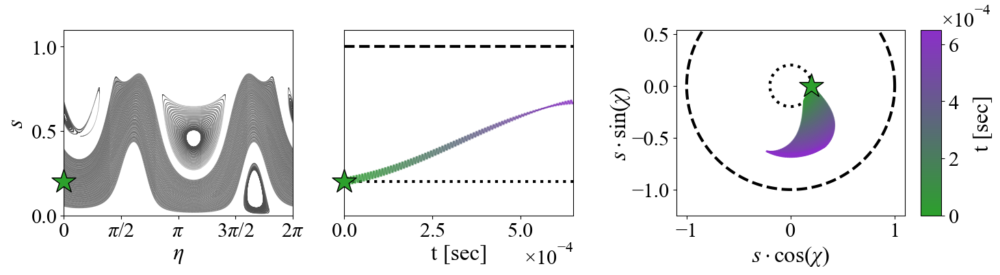

In [11]:
# Poincare
from matplotlib.ticker import ScalarFormatter, MaxNLocator

%matplotlib inline
import numpy as np

# Single particle data
# single_data = np.load('convective_traj.npy',allow_pickle=True)
# single_data = single_data.item()
# t_all_single = single_data['t']
# eta_all_single = single_data['eta']
# s_all_single = single_data['s']
t_all_single = t
eta_all_single = eta
s_all_single = s

# Full Poincare data
full_data = np.load("full_data_convQI_Bc624.npz")
_etas_all = full_data["etas_all"]
_s_all = full_data["s_all"]

import matplotlib
# matplotlib.use("TkAgg")
import matplotlib.pyplot as plt

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# 1. Flatten the inputs into 1D NumPy arrays
etas_flat = np.asarray(_etas_all).ravel()
s_flat = np.asarray(_s_all).ravel()

# 2. Pre-calculate the X-axis values
x_vals = np.mod(etas_flat, 2 * np.pi)

# 3. Create a boolean mask for your condition
mask = s_flat < 0.0

# 4. Plot all the points where s < 0.15 at once
ax[0].scatter(
    x_vals[mask], s_flat[mask],
    marker="o", s=1.3, alpha=0.9,
    edgecolors="none", color="#4d4d4d", rasterized=True
)

# 5. Plot all the remaining points (s >= 0.15) at once (~ is the "NOT" operator)
ax[0].scatter(
    x_vals[~mask], s_flat[~mask],
    marker="o", s=0.3, alpha=0.3,
    edgecolors="none", color="#4d4d4d", rasterized=True
)


FontSize = 24
SERIF = "Times New Roman"
label_kw = {"fontfamily": SERIF, "fontsize": FontSize}
tick_labelsize = FontSize - 2

plt.rcParams.update(
    {
        "font.family": SERIF,
        "font.serif": [SERIF, "Liberation Serif", "Nimbus Roman No9 L", "DejaVu Serif"],
        "mathtext.fontset": "custom",
        "mathtext.rm": SERIF,
        "mathtext.it": f"{SERIF}:italic",
        "mathtext.bf": f"{SERIF}:bold",
        "figure.figsize": (6.4, 4.8),
    }
)



# Default axes box in figure coordinates (0–1); tune once, reuse everywhere
AXES_MARGINS_0 = dict(left=0.07, right=0.94, bottom=0.22, top=0.90) # percentages of the figure height/width

plt.rcParams.update(
    {
        "figure.subplot.left": AXES_MARGINS_0["left"],
        "figure.subplot.right": AXES_MARGINS_0["right"],
        "figure.subplot.bottom": AXES_MARGINS_0["bottom"],
        "figure.subplot.top": AXES_MARGINS_0["top"],
        # optional: spacing for multi-panel figures
        "figure.subplot.wspace": 0.25,
        "figure.subplot.hspace": 0.25,
    }
)


# apply to figures to apply even if using tight_layout
def apply_standard_axes(fig,margins):
    fig.subplots_adjust(**margins)

apply_standard_axes(fig,AXES_MARGINS_0)

def apply_panel_fonts(ax, labelsize=tick_labelsize, family=SERIF):
    """Force identical tick / offset fonts on an axes (incl. colorbar axes)."""
    ax.tick_params(axis="both", which="major", labelsize=labelsize)
    for label in list(ax.get_xticklabels()) + list(ax.get_yticklabels()):
        label.set_fontfamily(family)
        label.set_fontsize(labelsize)
    for axis in (ax.xaxis, ax.yaxis):
        offset = axis.get_offset_text()
        offset.set_fontfamily(family)
        offset.set_fontsize(labelsize)



from matplotlib.colors import LinearSegmentedColormap

ax[0].set_xlabel(r"$\eta$",**label_kw)
ax[0].set_ylabel(r"$s$",**label_kw)
ax[0].set_xlim([0, 2 * np.pi])
ax[0].set_ylim([0, 0.8])
ax[0].tick_params(axis='both', which='major', labelsize=tick_labelsize)
ax[0].set_xticks(
    [0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi]
)
ax[0].set_xticklabels(
    [r"$0$", r"$\pi/2$", r"$\pi$", r"$3\pi/2$", r"$2\pi$"]
)

times = np.array(t_all_single[:]) # initial point is included because a random s,eta is initialized but then the particle is launched from the chi mirror point
final_time = np.sum(times)
times_total = np.zeros_like(times)
for i in range(len(times)):
    times_total[i] = np.sum(times[:i])
cmap = LinearSegmentedColormap.from_list('green_purple', ['#2ca02c', '#8b2fc9'])
norm = plt.Normalize(0, final_time)

ax[0].scatter(
    np.mod(eta_all_single[0], 2 * np.pi),
    s_all_single[0],
    c=times_total[0],
    cmap=cmap,
    norm=norm,
    marker="*",
    s=700,
    edgecolors="black",
    clip_on=False,
    rasterized=True,
    zorder=11,
)

from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list('green_purple', ['#2ca02c', '#8b2fc9'])
norm = plt.Normalize(t[0], t[-1])

# rho vs t
pts = np.column_stack([t, s]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_rho = LineCollection(segs, cmap=cmap, norm=norm, linewidths=2.0)
lc_rho.set_array(t[:-1])
ax[1].add_collection(lc_rho)
ax[1].set_xlim(t[0], t[-1])
ax[1].set_ylim(s.min() * 0.5, s.max() * 1.05)
ax[1].set_xlabel('t [sec]', **label_kw)
# ax[1].set_ylabel(r'$s$', **label_kw)
ax[1].yaxis.set_visible(False)

# x-y plane
pts = np.column_stack([x, y]).reshape(-1, 1, 2)
segs = np.concatenate([pts[:-1], pts[1:]], axis=1)
lc_xy = LineCollection(segs, cmap=cmap, norm=norm, linewidths=2.0)
lc_xy.set_array(t[:-1])
ax[2].add_collection(lc_xy)

# Initial flux surface and LCFS in (s cos χ, s sin χ) coordinates
chi_circle = np.linspace(0, 2 * np.pi, 400)
s_init = float(np.asarray(s_all_single[0]).ravel()[0])
ax[2].plot(
    s_init * np.cos(chi_circle),
    s_init * np.sin(chi_circle),
    color="k",
    ls=":",
    lw=3.0,
    zorder=1,
)
ax[2].plot(
    np.cos(chi_circle),
    np.sin(chi_circle),
    color="k",
    ls="--",
    lw=3.0,
    zorder=1,
)

ax[2].set_xlabel(r'$s \cdot \cos(\chi)$', **label_kw)

# --- Change 1: Pull the y-axis label closer using a negative labelpad ---
ax[2].set_ylabel(r'$s \cdot \sin(\chi)$', labelpad=0, **label_kw)

# Mark first bounce on s-vs-t and poloidal panels (same star as Poincare plot)
bounce_t = 0
ibounce = np.argmin(np.abs(t - bounce_t))
star_kw = dict(
    cmap=cmap,
    norm=norm,
    marker="*",
    s=700,
    edgecolors="black",
    clip_on=False,
    rasterized=True,
    zorder=5,
)
ax[1].scatter(t[ibounce], s[ibounce], c=t[ibounce], **star_kw)
ax[2].scatter(x[ibounce], y[ibounce], c=t[ibounce], **star_kw)


# --- Change 2: useMathText=True formats '1e-3' as '10^{-3}' ---
ax[1].ticklabel_format(style='sci', axis='x', scilimits=(0,0), useMathText=True)

ax[1].tick_params(axis='both', which='major', labelsize=tick_labelsize)
ax[2].tick_params(axis='both', which='major', labelsize=tick_labelsize)

# --- Change 3a: Force the x-axis scientific notation offset text to tick_labelsize ---
ax[1].xaxis.get_offset_text().set_fontsize(tick_labelsize)

# cb = fig.colorbar(lc_rho,ax=ax[2])





fig.subplots_adjust(wspace=0.45)

# --- ADJUST SPACING MANUALLY ---
# 1. Get the bounding box positions of the axes
pos0 = ax[0].get_position()
pos1 = ax[1].get_position()
pos2 = ax[2].get_position()

# 2. Define how much closer you want subplot 1 and 2 to be.
# This value is in "figure fraction" coordinates (from 0 to 1).
shift = 0.05

# 3. Shift the second subplot to the left
new_pos1 = [pos1.x0 - shift, pos1.y0, pos1.width, pos1.height]
ax[1].set_position(new_pos1)

# 4. Shift the third subplot by the EXACT SAME amount. 
# This ensures the gap between subplot 2 and 3 remains completely unchanged.
new_pos2 = [pos2.x0 - shift, pos2.y0, pos2.width, pos2.height]
ax[2].set_position(new_pos2)

# Equal aspect with fixed panel size: set ylim after final position, xlim auto-adjusts
ax[2].set_aspect('equal', adjustable='datalim')
ax[2].set_ylim(-0.7, 0.1)

# --- 1. Get the final position of ax[2] after your shifts have been applied ---
# We use new_pos2 because it contains the updated coordinates [x0, y0, width, height]
ax2_x0, ax2_y0, ax2_w, ax2_h = new_pos2

# --- 2. Define the colorbar position dynamically ---
cb_width = 0.02          # Width of the colorbar track
cb_padding = 0.015       # Distance between ax[2] and the colorbar (Decrease this to bring it closer!)
cb_x0 = ax2_x0 + ax2_w + cb_padding

# --- 3. Create the explicit colorbar axis and draw it ---
cax = fig.add_axes([cb_x0, ax2_y0, cb_width, ax2_h])
cb = fig.colorbar(lc_rho, cax=cax)

# --- 4. Format your colorbar label and ticks (Adjusted labelpad to look nice) ---
cb.set_label("t [sec]", fontfamily=SERIF, fontsize=FontSize, labelpad=15)
fmt = ScalarFormatter(useMathText=True)
fmt.set_powerlimits((0, 0))
cb.ax.yaxis.set_major_formatter(fmt)
cb.ax.yaxis.get_offset_text().set_position((1.0, 1.02))
cb.ax.yaxis.get_offset_text().set_ha('left')
cb.ax.yaxis.set_major_locator(MaxNLocator(nbins='auto', steps=[1, 2, 5, 10]))
cb.ax.tick_params(labelsize=tick_labelsize)
cb.ax.yaxis.get_offset_text().set_fontsize(tick_labelsize)



ax[1].plot(
    [0,7e-4],
    [s_init,s_init],
    color="k",
    ls=":",
    lw=3.0,
    zorder=1,
)
ax[1].plot(
    [0,7e-4],
    [1,1],
    color="k",
    ls="--",
    lw=3.0,
    zorder=1,
)

ax[2].set_ylim(-1.01,0.3)
ax[0].set_ylim(0,1.1)
ax[1].set_ylim(0,1.1)



# Enforce identical fonts on all panel ticks and the colorbar.
for _ax in ax:
    apply_panel_fonts(_ax)
apply_panel_fonts(cb.ax)
for _ax in (ax[0], ax[1], ax[2]):
    _ax.xaxis.label.set_fontfamily(SERIF)
    _ax.xaxis.label.set_fontsize(FontSize)
    _ax.yaxis.label.set_fontfamily(SERIF)
    _ax.yaxis.label.set_fontsize(FontSize)
cb.ax.yaxis.label.set_fontfamily(SERIF)
cb.ax.yaxis.label.set_fontsize(FontSize)

plt.savefig("figures/convection_threepanel.pdf", dpi=300)
plt.show()

In [20]:
print(s[0])
print(eta[0])

0.5
-0.0
